# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

A subdirectory or file data already exists.


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

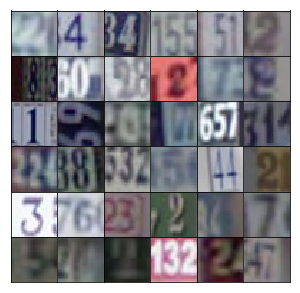

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [10]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x = tf.layers.dense(z, 4*4*512)
        x = tf.reshape(x, (-1,4,4,512))
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha * x, x)
        
        x = tf.layers.conv2d_transpose(x, 256, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha * x, x)
        
        x = tf.layers.conv2d_transpose(x, 128, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha * x, x)
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(x, output_dim, 5, strides=2, padding='same')
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [11]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        x = tf.maximum(alpha * x, x)
        
        x = tf.layers.conv2d(x, 128, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        
        x = tf.layers.conv2d(x, 256, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        
        x = tf.reshape(x, (-1,4*4*256))
        logits = tf.layers.dense(x, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [12]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [13]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [14]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [15]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [16]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [19]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.001
batch_size = 128
epochs = 10
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/10... Discriminator Loss: 0.0984... Generator Loss: 16.9562
Epoch 1/10... Discriminator Loss: 0.1251... Generator Loss: 16.5178
Epoch 1/10... Discriminator Loss: 0.2032... Generator Loss: 2.8142
Epoch 1/10... Discriminator Loss: 0.8296... Generator Loss: 0.9915
Epoch 1/10... Discriminator Loss: 1.0786... Generator Loss: 0.7323
Epoch 1/10... Discriminator Loss: 1.1669... Generator Loss: 1.5292
Epoch 1/10... Discriminator Loss: 1.1101... Generator Loss: 1.4271
Epoch 1/10... Discriminator Loss: 0.9634... Generator Loss: 1.4064
Epoch 1/10... Discriminator Loss: 1.4354... Generator Loss: 0.6535
Epoch 1/10... Discriminator Loss: 0.8849... Generator Loss: 1.3696


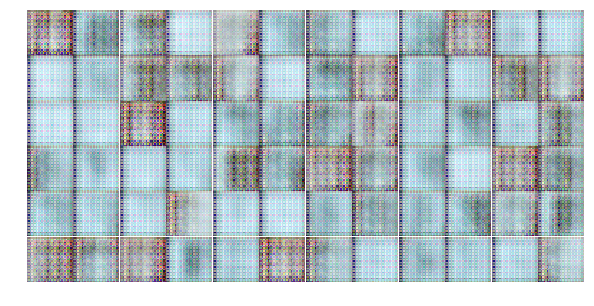

Epoch 1/10... Discriminator Loss: 0.9900... Generator Loss: 0.8469
Epoch 1/10... Discriminator Loss: 0.9389... Generator Loss: 1.3491
Epoch 1/10... Discriminator Loss: 0.9784... Generator Loss: 0.7806
Epoch 1/10... Discriminator Loss: 1.3517... Generator Loss: 1.9758
Epoch 1/10... Discriminator Loss: 0.7248... Generator Loss: 1.9126
Epoch 1/10... Discriminator Loss: 0.9876... Generator Loss: 0.7672
Epoch 1/10... Discriminator Loss: 1.3913... Generator Loss: 2.0638
Epoch 1/10... Discriminator Loss: 0.6354... Generator Loss: 1.9930
Epoch 1/10... Discriminator Loss: 0.8532... Generator Loss: 1.3693
Epoch 1/10... Discriminator Loss: 1.0718... Generator Loss: 2.0737


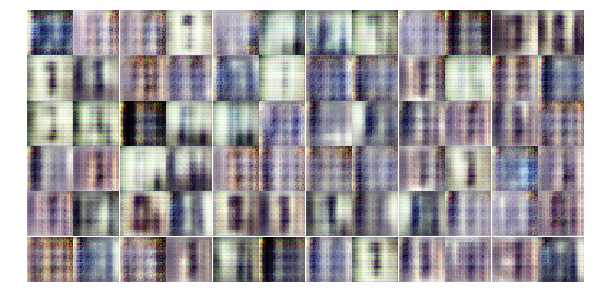

Epoch 1/10... Discriminator Loss: 1.5077... Generator Loss: 0.4792
Epoch 1/10... Discriminator Loss: 1.1013... Generator Loss: 1.1638
Epoch 1/10... Discriminator Loss: 1.5884... Generator Loss: 0.5479
Epoch 1/10... Discriminator Loss: 1.5619... Generator Loss: 0.3652
Epoch 1/10... Discriminator Loss: 0.5731... Generator Loss: 2.3441
Epoch 1/10... Discriminator Loss: 1.2073... Generator Loss: 0.7892
Epoch 1/10... Discriminator Loss: 1.0338... Generator Loss: 0.7627
Epoch 1/10... Discriminator Loss: 1.2335... Generator Loss: 1.0703
Epoch 1/10... Discriminator Loss: 1.0773... Generator Loss: 0.8398
Epoch 1/10... Discriminator Loss: 3.2373... Generator Loss: 5.9667


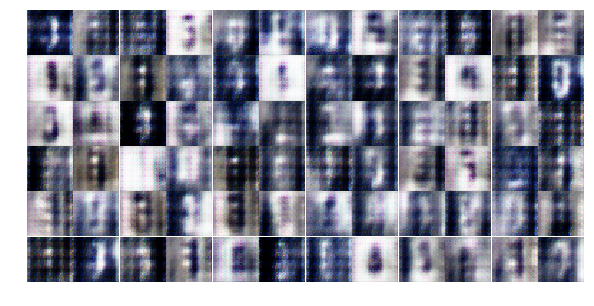

Epoch 1/10... Discriminator Loss: 1.1195... Generator Loss: 1.0435
Epoch 1/10... Discriminator Loss: 1.0402... Generator Loss: 0.9356
Epoch 1/10... Discriminator Loss: 1.4728... Generator Loss: 0.7072
Epoch 1/10... Discriminator Loss: 1.1399... Generator Loss: 1.0791
Epoch 1/10... Discriminator Loss: 1.3421... Generator Loss: 0.7641
Epoch 1/10... Discriminator Loss: 1.5496... Generator Loss: 0.7358
Epoch 1/10... Discriminator Loss: 1.2853... Generator Loss: 0.8816
Epoch 1/10... Discriminator Loss: 1.3562... Generator Loss: 1.1293
Epoch 1/10... Discriminator Loss: 1.0331... Generator Loss: 1.0325
Epoch 1/10... Discriminator Loss: 1.2608... Generator Loss: 0.9094


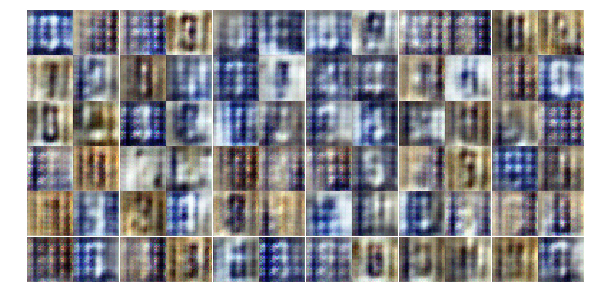

Epoch 1/10... Discriminator Loss: 1.2678... Generator Loss: 0.7952
Epoch 1/10... Discriminator Loss: 1.4720... Generator Loss: 0.5244
Epoch 1/10... Discriminator Loss: 1.2403... Generator Loss: 1.3598
Epoch 1/10... Discriminator Loss: 0.9635... Generator Loss: 1.3380
Epoch 1/10... Discriminator Loss: 1.4371... Generator Loss: 0.7071
Epoch 1/10... Discriminator Loss: 1.2069... Generator Loss: 0.8589
Epoch 1/10... Discriminator Loss: 1.4109... Generator Loss: 0.7901
Epoch 1/10... Discriminator Loss: 1.5884... Generator Loss: 0.6669
Epoch 1/10... Discriminator Loss: 1.2529... Generator Loss: 0.6601
Epoch 1/10... Discriminator Loss: 1.3001... Generator Loss: 1.0671


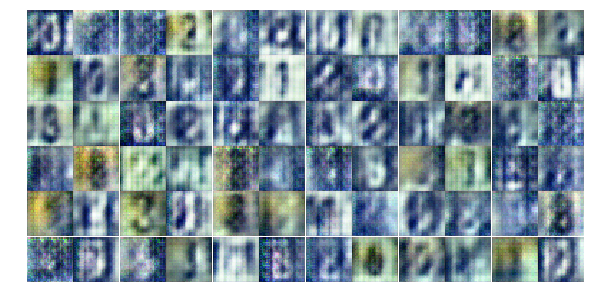

Epoch 1/10... Discriminator Loss: 1.1969... Generator Loss: 0.8039
Epoch 1/10... Discriminator Loss: 1.2903... Generator Loss: 0.8343
Epoch 1/10... Discriminator Loss: 1.4209... Generator Loss: 1.0123
Epoch 1/10... Discriminator Loss: 1.5448... Generator Loss: 0.5650
Epoch 1/10... Discriminator Loss: 1.3117... Generator Loss: 0.8091
Epoch 1/10... Discriminator Loss: 1.4092... Generator Loss: 0.6505
Epoch 1/10... Discriminator Loss: 1.5987... Generator Loss: 0.5201
Epoch 2/10... Discriminator Loss: 1.4991... Generator Loss: 0.7104
Epoch 2/10... Discriminator Loss: 1.3640... Generator Loss: 0.7891
Epoch 2/10... Discriminator Loss: 1.5375... Generator Loss: 0.6112


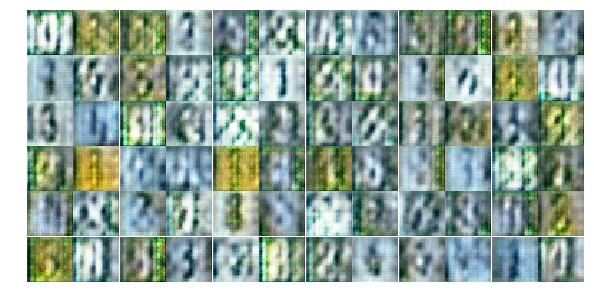

Epoch 2/10... Discriminator Loss: 1.6894... Generator Loss: 0.6098
Epoch 2/10... Discriminator Loss: 1.2351... Generator Loss: 0.8776
Epoch 2/10... Discriminator Loss: 1.3571... Generator Loss: 0.7166
Epoch 2/10... Discriminator Loss: 1.4209... Generator Loss: 0.7102
Epoch 2/10... Discriminator Loss: 1.0938... Generator Loss: 0.9512
Epoch 2/10... Discriminator Loss: 1.1797... Generator Loss: 0.8713
Epoch 2/10... Discriminator Loss: 1.3039... Generator Loss: 0.7915
Epoch 2/10... Discriminator Loss: 1.3270... Generator Loss: 0.7561
Epoch 2/10... Discriminator Loss: 1.2572... Generator Loss: 0.7495
Epoch 2/10... Discriminator Loss: 1.5813... Generator Loss: 0.5725


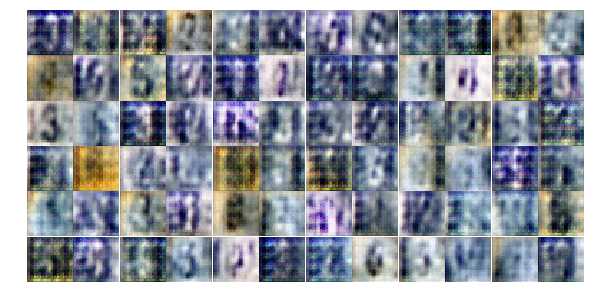

Epoch 2/10... Discriminator Loss: 1.4986... Generator Loss: 0.7886
Epoch 2/10... Discriminator Loss: 1.3824... Generator Loss: 0.8501
Epoch 2/10... Discriminator Loss: 1.2518... Generator Loss: 0.9913
Epoch 2/10... Discriminator Loss: 1.1417... Generator Loss: 0.8069
Epoch 2/10... Discriminator Loss: 1.3046... Generator Loss: 0.9831
Epoch 2/10... Discriminator Loss: 1.1933... Generator Loss: 0.7169
Epoch 2/10... Discriminator Loss: 1.1670... Generator Loss: 0.8201
Epoch 2/10... Discriminator Loss: 1.4128... Generator Loss: 0.6212
Epoch 2/10... Discriminator Loss: 1.0733... Generator Loss: 0.9081
Epoch 2/10... Discriminator Loss: 1.4734... Generator Loss: 0.7049


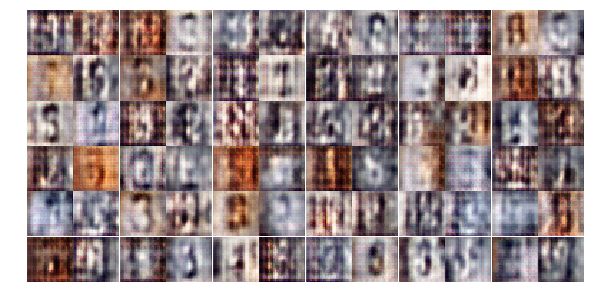

Epoch 2/10... Discriminator Loss: 1.3541... Generator Loss: 0.7543
Epoch 2/10... Discriminator Loss: 1.1503... Generator Loss: 0.9260
Epoch 2/10... Discriminator Loss: 1.1307... Generator Loss: 0.9286
Epoch 2/10... Discriminator Loss: 1.4634... Generator Loss: 0.7622
Epoch 2/10... Discriminator Loss: 1.3144... Generator Loss: 0.8398
Epoch 2/10... Discriminator Loss: 1.2498... Generator Loss: 1.0923
Epoch 2/10... Discriminator Loss: 1.3011... Generator Loss: 0.7169
Epoch 2/10... Discriminator Loss: 1.3330... Generator Loss: 0.6795
Epoch 2/10... Discriminator Loss: 1.3460... Generator Loss: 0.8540
Epoch 2/10... Discriminator Loss: 1.1212... Generator Loss: 0.8985


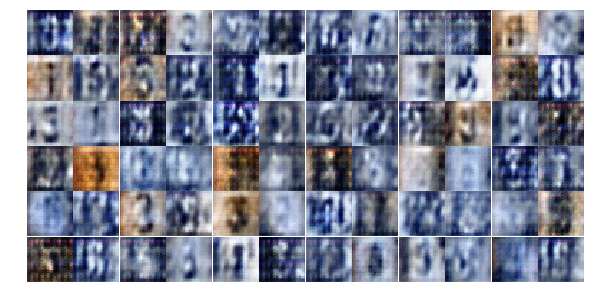

Epoch 2/10... Discriminator Loss: 1.2848... Generator Loss: 0.6580
Epoch 2/10... Discriminator Loss: 1.2432... Generator Loss: 0.9554
Epoch 2/10... Discriminator Loss: 1.0934... Generator Loss: 0.9304
Epoch 2/10... Discriminator Loss: 1.6381... Generator Loss: 0.4250
Epoch 2/10... Discriminator Loss: 1.2502... Generator Loss: 0.8003
Epoch 2/10... Discriminator Loss: 1.2535... Generator Loss: 0.8176
Epoch 2/10... Discriminator Loss: 1.2108... Generator Loss: 0.8299
Epoch 2/10... Discriminator Loss: 1.4777... Generator Loss: 1.0451
Epoch 2/10... Discriminator Loss: 1.2514... Generator Loss: 0.8661
Epoch 2/10... Discriminator Loss: 1.4567... Generator Loss: 0.7009


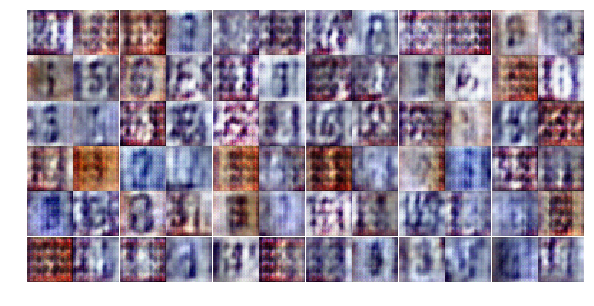

Epoch 2/10... Discriminator Loss: 1.1438... Generator Loss: 0.9616
Epoch 2/10... Discriminator Loss: 1.2781... Generator Loss: 0.8536
Epoch 2/10... Discriminator Loss: 1.3257... Generator Loss: 0.6796
Epoch 2/10... Discriminator Loss: 1.2890... Generator Loss: 0.7719
Epoch 2/10... Discriminator Loss: 1.2765... Generator Loss: 0.7763
Epoch 2/10... Discriminator Loss: 1.3856... Generator Loss: 0.7329
Epoch 2/10... Discriminator Loss: 1.3524... Generator Loss: 0.6990
Epoch 2/10... Discriminator Loss: 1.2744... Generator Loss: 0.7519
Epoch 2/10... Discriminator Loss: 1.2047... Generator Loss: 0.8466
Epoch 2/10... Discriminator Loss: 1.2551... Generator Loss: 0.8387


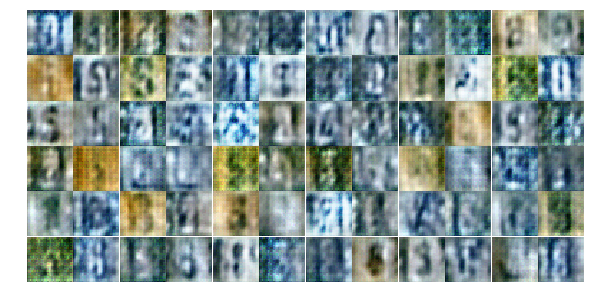

Epoch 2/10... Discriminator Loss: 1.4875... Generator Loss: 0.8244
Epoch 2/10... Discriminator Loss: 1.1874... Generator Loss: 0.8519
Epoch 2/10... Discriminator Loss: 1.3648... Generator Loss: 0.6685
Epoch 2/10... Discriminator Loss: 1.4348... Generator Loss: 0.5407
Epoch 3/10... Discriminator Loss: 1.3087... Generator Loss: 0.7587
Epoch 3/10... Discriminator Loss: 1.4126... Generator Loss: 0.8018
Epoch 3/10... Discriminator Loss: 1.3280... Generator Loss: 0.6142
Epoch 3/10... Discriminator Loss: 1.2191... Generator Loss: 0.8460
Epoch 3/10... Discriminator Loss: 1.3704... Generator Loss: 0.7325
Epoch 3/10... Discriminator Loss: 1.3061... Generator Loss: 0.8038


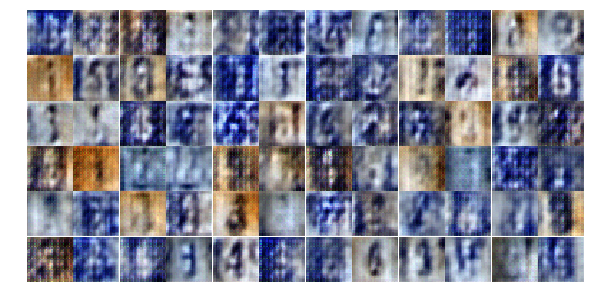

Epoch 3/10... Discriminator Loss: 1.2961... Generator Loss: 0.7544
Epoch 3/10... Discriminator Loss: 1.2214... Generator Loss: 0.9024
Epoch 3/10... Discriminator Loss: 1.2110... Generator Loss: 0.9638
Epoch 3/10... Discriminator Loss: 1.1960... Generator Loss: 0.7717
Epoch 3/10... Discriminator Loss: 1.4827... Generator Loss: 0.6469
Epoch 3/10... Discriminator Loss: 1.1798... Generator Loss: 0.9753
Epoch 3/10... Discriminator Loss: 1.3139... Generator Loss: 0.7937
Epoch 3/10... Discriminator Loss: 1.3599... Generator Loss: 0.6023
Epoch 3/10... Discriminator Loss: 1.5107... Generator Loss: 0.4790
Epoch 3/10... Discriminator Loss: 1.5222... Generator Loss: 0.6773


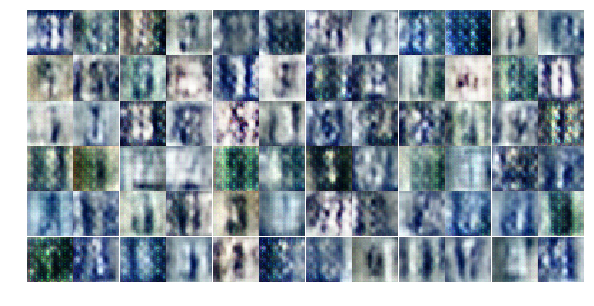

Epoch 3/10... Discriminator Loss: 1.1697... Generator Loss: 0.8289
Epoch 3/10... Discriminator Loss: 1.2716... Generator Loss: 0.7995
Epoch 3/10... Discriminator Loss: 1.2155... Generator Loss: 0.7483
Epoch 3/10... Discriminator Loss: 1.2367... Generator Loss: 0.8819
Epoch 3/10... Discriminator Loss: 1.2936... Generator Loss: 0.8294
Epoch 3/10... Discriminator Loss: 1.1790... Generator Loss: 1.0660
Epoch 3/10... Discriminator Loss: 1.4742... Generator Loss: 0.4685
Epoch 3/10... Discriminator Loss: 1.2072... Generator Loss: 0.9531
Epoch 3/10... Discriminator Loss: 1.5502... Generator Loss: 0.6153
Epoch 3/10... Discriminator Loss: 1.1863... Generator Loss: 0.9225


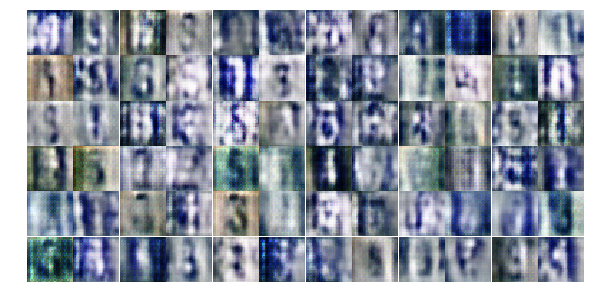

Epoch 3/10... Discriminator Loss: 1.2195... Generator Loss: 0.8352
Epoch 3/10... Discriminator Loss: 1.0339... Generator Loss: 0.9485
Epoch 3/10... Discriminator Loss: 1.0822... Generator Loss: 1.0937
Epoch 3/10... Discriminator Loss: 1.3645... Generator Loss: 0.8317
Epoch 3/10... Discriminator Loss: 1.3132... Generator Loss: 0.9472
Epoch 3/10... Discriminator Loss: 1.4400... Generator Loss: 0.6441
Epoch 3/10... Discriminator Loss: 1.2041... Generator Loss: 0.8810
Epoch 3/10... Discriminator Loss: 1.4241... Generator Loss: 0.6704
Epoch 3/10... Discriminator Loss: 1.0856... Generator Loss: 0.7412
Epoch 3/10... Discriminator Loss: 1.0854... Generator Loss: 1.0591


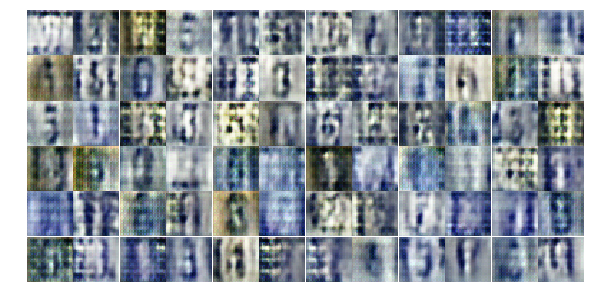

Epoch 3/10... Discriminator Loss: 1.1829... Generator Loss: 0.8174
Epoch 3/10... Discriminator Loss: 1.2943... Generator Loss: 1.0663
Epoch 3/10... Discriminator Loss: 1.2350... Generator Loss: 0.9557
Epoch 3/10... Discriminator Loss: 1.2575... Generator Loss: 0.5801
Epoch 3/10... Discriminator Loss: 1.0755... Generator Loss: 1.5922
Epoch 3/10... Discriminator Loss: 1.1761... Generator Loss: 0.9656
Epoch 3/10... Discriminator Loss: 1.1239... Generator Loss: 1.2890
Epoch 3/10... Discriminator Loss: 1.3020... Generator Loss: 0.9885
Epoch 3/10... Discriminator Loss: 1.1897... Generator Loss: 0.8206
Epoch 3/10... Discriminator Loss: 0.9668... Generator Loss: 0.9582


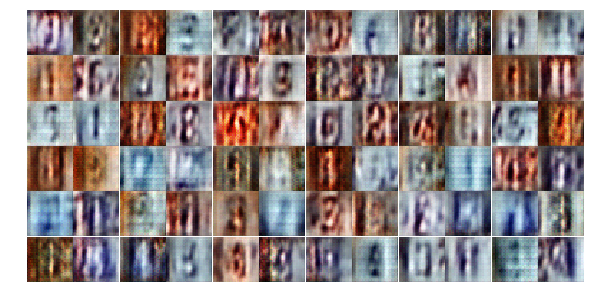

Epoch 3/10... Discriminator Loss: 1.3483... Generator Loss: 0.8365
Epoch 3/10... Discriminator Loss: 1.1773... Generator Loss: 0.6742
Epoch 3/10... Discriminator Loss: 1.3916... Generator Loss: 0.7105
Epoch 3/10... Discriminator Loss: 1.2602... Generator Loss: 0.8687
Epoch 3/10... Discriminator Loss: 1.3064... Generator Loss: 0.7853
Epoch 3/10... Discriminator Loss: 1.1598... Generator Loss: 0.8130
Epoch 3/10... Discriminator Loss: 1.1234... Generator Loss: 1.0713
Epoch 3/10... Discriminator Loss: 1.1935... Generator Loss: 0.7385
Epoch 3/10... Discriminator Loss: 0.9455... Generator Loss: 0.9378
Epoch 3/10... Discriminator Loss: 1.1988... Generator Loss: 0.9147


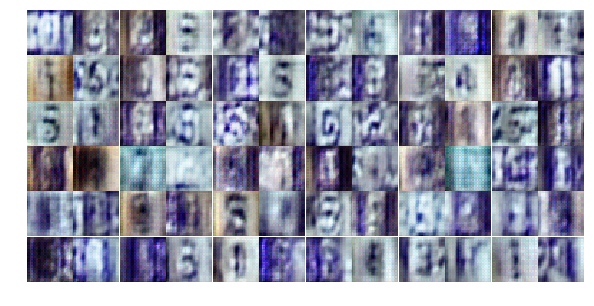

Epoch 3/10... Discriminator Loss: 1.2145... Generator Loss: 1.0908
Epoch 4/10... Discriminator Loss: 1.0607... Generator Loss: 1.0756
Epoch 4/10... Discriminator Loss: 1.0096... Generator Loss: 1.2912
Epoch 4/10... Discriminator Loss: 0.9594... Generator Loss: 1.1402
Epoch 4/10... Discriminator Loss: 1.1609... Generator Loss: 1.0255
Epoch 4/10... Discriminator Loss: 1.0805... Generator Loss: 1.0060
Epoch 4/10... Discriminator Loss: 1.2285... Generator Loss: 0.7562
Epoch 4/10... Discriminator Loss: 1.3197... Generator Loss: 1.5229
Epoch 4/10... Discriminator Loss: 1.1559... Generator Loss: 0.9937
Epoch 4/10... Discriminator Loss: 1.0875... Generator Loss: 0.7536


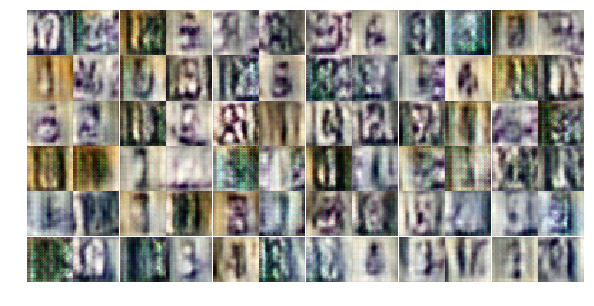

Epoch 4/10... Discriminator Loss: 1.2616... Generator Loss: 0.8162
Epoch 4/10... Discriminator Loss: 1.3057... Generator Loss: 0.5818
Epoch 4/10... Discriminator Loss: 1.3387... Generator Loss: 0.5002
Epoch 4/10... Discriminator Loss: 1.1915... Generator Loss: 0.8736
Epoch 4/10... Discriminator Loss: 1.2896... Generator Loss: 0.6076
Epoch 4/10... Discriminator Loss: 1.5067... Generator Loss: 0.3823
Epoch 4/10... Discriminator Loss: 1.3589... Generator Loss: 0.5188
Epoch 4/10... Discriminator Loss: 1.1024... Generator Loss: 0.8411
Epoch 4/10... Discriminator Loss: 1.1787... Generator Loss: 0.9864
Epoch 4/10... Discriminator Loss: 1.3564... Generator Loss: 1.4693


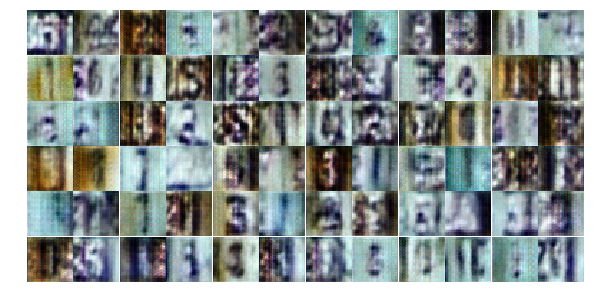

Epoch 4/10... Discriminator Loss: 1.1425... Generator Loss: 0.8022
Epoch 4/10... Discriminator Loss: 1.0565... Generator Loss: 0.9826
Epoch 4/10... Discriminator Loss: 1.1157... Generator Loss: 0.9538
Epoch 4/10... Discriminator Loss: 1.4639... Generator Loss: 0.5024
Epoch 4/10... Discriminator Loss: 0.9982... Generator Loss: 1.0865
Epoch 4/10... Discriminator Loss: 1.1695... Generator Loss: 1.6341
Epoch 4/10... Discriminator Loss: 1.3418... Generator Loss: 0.4858
Epoch 4/10... Discriminator Loss: 1.2164... Generator Loss: 1.1550
Epoch 4/10... Discriminator Loss: 1.0960... Generator Loss: 0.9868
Epoch 4/10... Discriminator Loss: 1.1756... Generator Loss: 1.3087


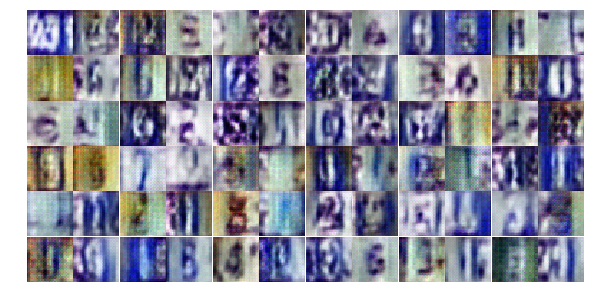

Epoch 4/10... Discriminator Loss: 1.1639... Generator Loss: 0.9080
Epoch 4/10... Discriminator Loss: 1.1482... Generator Loss: 0.6551
Epoch 4/10... Discriminator Loss: 1.4195... Generator Loss: 0.4692
Epoch 4/10... Discriminator Loss: 1.1471... Generator Loss: 0.8630
Epoch 4/10... Discriminator Loss: 1.1659... Generator Loss: 1.2349
Epoch 4/10... Discriminator Loss: 1.1711... Generator Loss: 0.8080
Epoch 4/10... Discriminator Loss: 1.5074... Generator Loss: 0.4312
Epoch 4/10... Discriminator Loss: 1.1450... Generator Loss: 0.9720
Epoch 4/10... Discriminator Loss: 1.3501... Generator Loss: 1.3050
Epoch 4/10... Discriminator Loss: 1.0588... Generator Loss: 0.9202


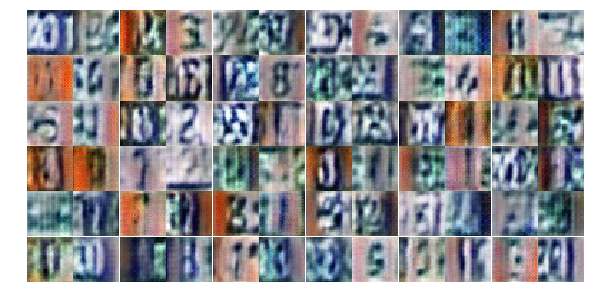

Epoch 4/10... Discriminator Loss: 1.0870... Generator Loss: 0.7955
Epoch 4/10... Discriminator Loss: 1.1858... Generator Loss: 0.6896
Epoch 4/10... Discriminator Loss: 1.3485... Generator Loss: 1.3825
Epoch 4/10... Discriminator Loss: 1.4752... Generator Loss: 0.5407
Epoch 4/10... Discriminator Loss: 1.0379... Generator Loss: 0.9795
Epoch 4/10... Discriminator Loss: 1.2671... Generator Loss: 0.9136
Epoch 4/10... Discriminator Loss: 1.1400... Generator Loss: 0.6066
Epoch 4/10... Discriminator Loss: 1.3274... Generator Loss: 0.8797
Epoch 4/10... Discriminator Loss: 1.0913... Generator Loss: 0.8237
Epoch 4/10... Discriminator Loss: 1.5654... Generator Loss: 0.4478


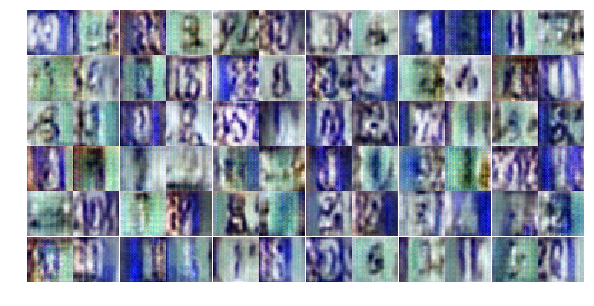

Epoch 4/10... Discriminator Loss: 1.1004... Generator Loss: 0.6581
Epoch 4/10... Discriminator Loss: 1.2931... Generator Loss: 0.6447
Epoch 4/10... Discriminator Loss: 1.1928... Generator Loss: 0.9930
Epoch 4/10... Discriminator Loss: 1.1902... Generator Loss: 1.1210
Epoch 4/10... Discriminator Loss: 1.0963... Generator Loss: 0.9509
Epoch 4/10... Discriminator Loss: 1.5015... Generator Loss: 0.8306
Epoch 4/10... Discriminator Loss: 1.0008... Generator Loss: 1.1101
Epoch 4/10... Discriminator Loss: 1.4244... Generator Loss: 0.4496
Epoch 4/10... Discriminator Loss: 1.1678... Generator Loss: 0.8790
Epoch 5/10... Discriminator Loss: 1.0019... Generator Loss: 0.8468


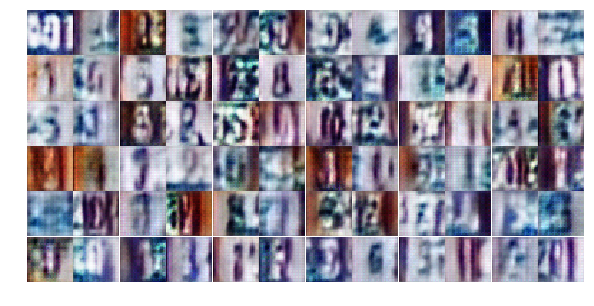

Epoch 5/10... Discriminator Loss: 1.0391... Generator Loss: 0.9796
Epoch 5/10... Discriminator Loss: 1.3148... Generator Loss: 0.5753
Epoch 5/10... Discriminator Loss: 1.7373... Generator Loss: 1.7756
Epoch 5/10... Discriminator Loss: 1.3064... Generator Loss: 0.5908
Epoch 5/10... Discriminator Loss: 1.0839... Generator Loss: 0.8860
Epoch 5/10... Discriminator Loss: 1.6295... Generator Loss: 0.3314
Epoch 5/10... Discriminator Loss: 1.2222... Generator Loss: 0.5874
Epoch 5/10... Discriminator Loss: 1.3158... Generator Loss: 0.6090
Epoch 5/10... Discriminator Loss: 1.5259... Generator Loss: 1.2326
Epoch 5/10... Discriminator Loss: 1.4404... Generator Loss: 1.0203


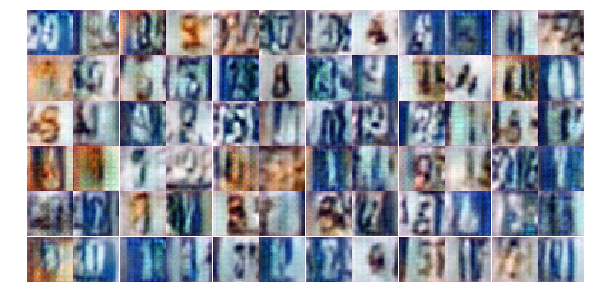

Epoch 5/10... Discriminator Loss: 1.3372... Generator Loss: 1.0581
Epoch 5/10... Discriminator Loss: 1.2372... Generator Loss: 0.7221
Epoch 5/10... Discriminator Loss: 1.2244... Generator Loss: 1.3986
Epoch 5/10... Discriminator Loss: 1.6072... Generator Loss: 0.3418
Epoch 5/10... Discriminator Loss: 1.2961... Generator Loss: 0.9545
Epoch 5/10... Discriminator Loss: 1.2305... Generator Loss: 1.2063
Epoch 5/10... Discriminator Loss: 1.2246... Generator Loss: 0.7385
Epoch 5/10... Discriminator Loss: 1.1320... Generator Loss: 0.7503
Epoch 5/10... Discriminator Loss: 1.1314... Generator Loss: 0.7100
Epoch 5/10... Discriminator Loss: 1.4767... Generator Loss: 0.3842


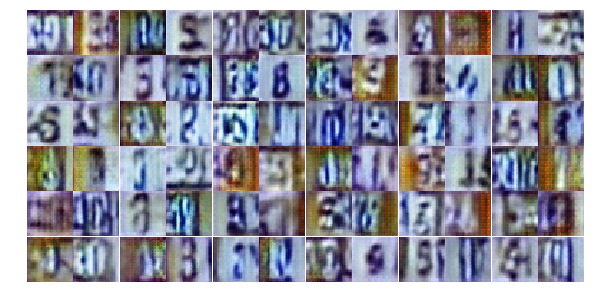

Epoch 5/10... Discriminator Loss: 1.6306... Generator Loss: 0.5110
Epoch 5/10... Discriminator Loss: 1.2075... Generator Loss: 0.6859
Epoch 5/10... Discriminator Loss: 1.2536... Generator Loss: 1.2438
Epoch 5/10... Discriminator Loss: 1.5488... Generator Loss: 0.3861
Epoch 5/10... Discriminator Loss: 1.3664... Generator Loss: 0.4986
Epoch 5/10... Discriminator Loss: 1.2089... Generator Loss: 1.1093
Epoch 5/10... Discriminator Loss: 1.2795... Generator Loss: 0.5650
Epoch 5/10... Discriminator Loss: 1.4074... Generator Loss: 0.6088
Epoch 5/10... Discriminator Loss: 1.2834... Generator Loss: 0.6090
Epoch 5/10... Discriminator Loss: 1.1241... Generator Loss: 1.0637


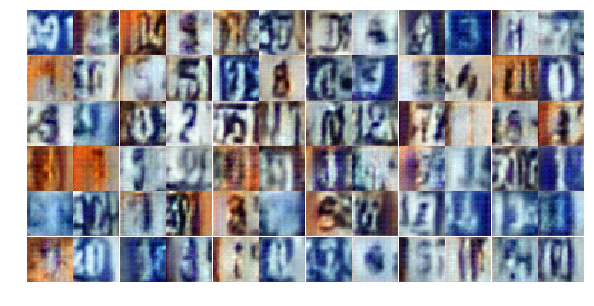

Epoch 5/10... Discriminator Loss: 1.3970... Generator Loss: 0.4394
Epoch 5/10... Discriminator Loss: 1.2149... Generator Loss: 0.7368
Epoch 5/10... Discriminator Loss: 1.1807... Generator Loss: 0.7281
Epoch 5/10... Discriminator Loss: 1.1719... Generator Loss: 1.3023
Epoch 5/10... Discriminator Loss: 1.3663... Generator Loss: 1.0678
Epoch 5/10... Discriminator Loss: 1.1662... Generator Loss: 0.9711
Epoch 5/10... Discriminator Loss: 1.1153... Generator Loss: 0.7864
Epoch 5/10... Discriminator Loss: 1.1284... Generator Loss: 0.8211
Epoch 5/10... Discriminator Loss: 1.5084... Generator Loss: 0.3818
Epoch 5/10... Discriminator Loss: 1.0488... Generator Loss: 0.8141


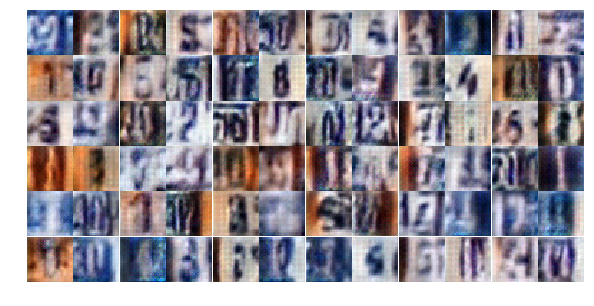

Epoch 5/10... Discriminator Loss: 1.1444... Generator Loss: 0.7791
Epoch 5/10... Discriminator Loss: 1.2950... Generator Loss: 0.5395
Epoch 5/10... Discriminator Loss: 1.3168... Generator Loss: 0.5017
Epoch 5/10... Discriminator Loss: 1.1683... Generator Loss: 0.8953
Epoch 5/10... Discriminator Loss: 1.4163... Generator Loss: 1.3017
Epoch 5/10... Discriminator Loss: 1.1427... Generator Loss: 0.7442
Epoch 5/10... Discriminator Loss: 1.3463... Generator Loss: 0.8170
Epoch 5/10... Discriminator Loss: 1.1141... Generator Loss: 0.8909
Epoch 5/10... Discriminator Loss: 1.2993... Generator Loss: 0.4661
Epoch 5/10... Discriminator Loss: 1.1875... Generator Loss: 0.8395


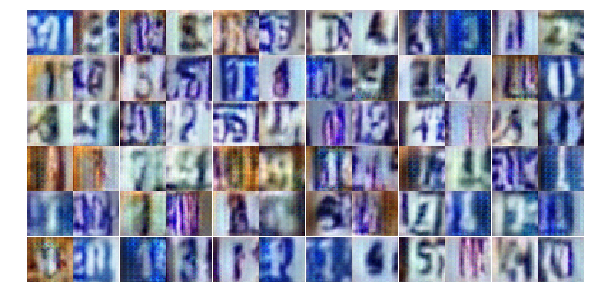

Epoch 5/10... Discriminator Loss: 1.4783... Generator Loss: 0.5139
Epoch 5/10... Discriminator Loss: 1.0880... Generator Loss: 0.7032
Epoch 5/10... Discriminator Loss: 1.1133... Generator Loss: 1.2653
Epoch 5/10... Discriminator Loss: 1.1967... Generator Loss: 0.6585
Epoch 5/10... Discriminator Loss: 1.4475... Generator Loss: 0.6888
Epoch 5/10... Discriminator Loss: 1.2165... Generator Loss: 0.6801
Epoch 6/10... Discriminator Loss: 1.2378... Generator Loss: 0.7503
Epoch 6/10... Discriminator Loss: 1.3481... Generator Loss: 0.8022
Epoch 6/10... Discriminator Loss: 1.2963... Generator Loss: 0.6079
Epoch 6/10... Discriminator Loss: 1.2916... Generator Loss: 0.8373


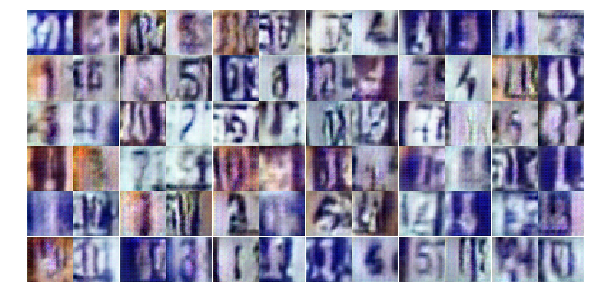

Epoch 6/10... Discriminator Loss: 1.1797... Generator Loss: 0.7797
Epoch 6/10... Discriminator Loss: 1.2280... Generator Loss: 0.8859
Epoch 6/10... Discriminator Loss: 1.0446... Generator Loss: 1.1503
Epoch 6/10... Discriminator Loss: 1.3757... Generator Loss: 0.5950
Epoch 6/10... Discriminator Loss: 1.2788... Generator Loss: 0.6632
Epoch 6/10... Discriminator Loss: 1.0245... Generator Loss: 0.8546
Epoch 6/10... Discriminator Loss: 1.3174... Generator Loss: 0.8121
Epoch 6/10... Discriminator Loss: 1.2855... Generator Loss: 0.6714
Epoch 6/10... Discriminator Loss: 0.8721... Generator Loss: 0.8858
Epoch 6/10... Discriminator Loss: 1.1765... Generator Loss: 0.6814


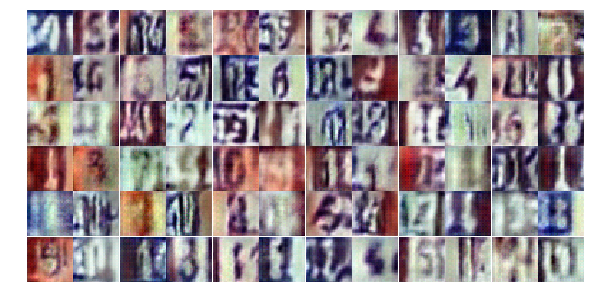

Epoch 6/10... Discriminator Loss: 1.4673... Generator Loss: 0.3955
Epoch 6/10... Discriminator Loss: 1.2654... Generator Loss: 1.3633
Epoch 6/10... Discriminator Loss: 1.5872... Generator Loss: 0.3599
Epoch 6/10... Discriminator Loss: 1.0265... Generator Loss: 0.7079
Epoch 6/10... Discriminator Loss: 1.1890... Generator Loss: 1.1804
Epoch 6/10... Discriminator Loss: 1.1262... Generator Loss: 0.9403
Epoch 6/10... Discriminator Loss: 1.3870... Generator Loss: 0.5035
Epoch 6/10... Discriminator Loss: 1.1699... Generator Loss: 0.5778
Epoch 6/10... Discriminator Loss: 1.3343... Generator Loss: 1.0926
Epoch 6/10... Discriminator Loss: 1.2472... Generator Loss: 0.7090


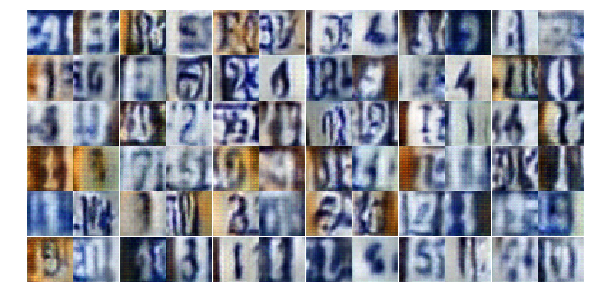

Epoch 6/10... Discriminator Loss: 1.4693... Generator Loss: 0.4332
Epoch 6/10... Discriminator Loss: 1.0994... Generator Loss: 1.2254
Epoch 6/10... Discriminator Loss: 1.2110... Generator Loss: 1.0245
Epoch 6/10... Discriminator Loss: 1.3941... Generator Loss: 0.4543
Epoch 6/10... Discriminator Loss: 1.4266... Generator Loss: 1.0252
Epoch 6/10... Discriminator Loss: 1.5707... Generator Loss: 0.3791
Epoch 6/10... Discriminator Loss: 1.1538... Generator Loss: 0.7163
Epoch 6/10... Discriminator Loss: 1.0330... Generator Loss: 1.1048
Epoch 6/10... Discriminator Loss: 1.2460... Generator Loss: 0.7798
Epoch 6/10... Discriminator Loss: 1.1791... Generator Loss: 0.7779


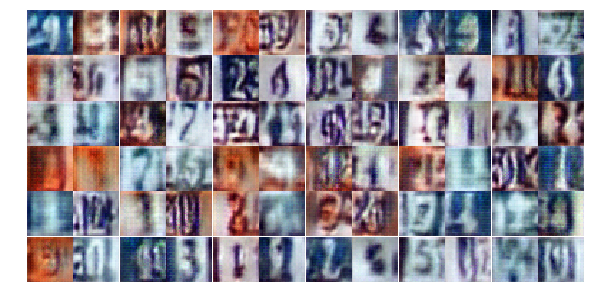

Epoch 6/10... Discriminator Loss: 1.3631... Generator Loss: 0.4689
Epoch 6/10... Discriminator Loss: 1.2829... Generator Loss: 0.5927
Epoch 6/10... Discriminator Loss: 1.1607... Generator Loss: 0.8124
Epoch 6/10... Discriminator Loss: 1.3648... Generator Loss: 0.5115
Epoch 6/10... Discriminator Loss: 1.3236... Generator Loss: 0.4856
Epoch 6/10... Discriminator Loss: 1.1874... Generator Loss: 0.6985
Epoch 6/10... Discriminator Loss: 1.2658... Generator Loss: 0.6903
Epoch 6/10... Discriminator Loss: 1.0715... Generator Loss: 0.9410
Epoch 6/10... Discriminator Loss: 1.2229... Generator Loss: 0.7202
Epoch 6/10... Discriminator Loss: 0.8483... Generator Loss: 1.1760


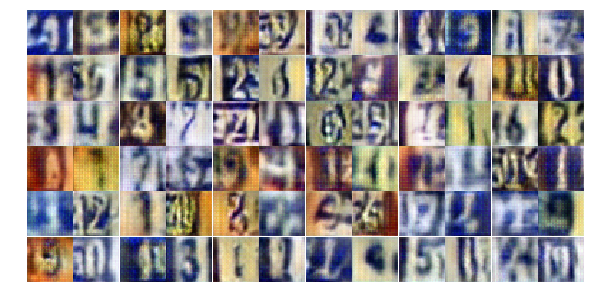

Epoch 6/10... Discriminator Loss: 1.6819... Generator Loss: 0.3115
Epoch 6/10... Discriminator Loss: 1.2952... Generator Loss: 0.6123
Epoch 6/10... Discriminator Loss: 1.1113... Generator Loss: 0.7286
Epoch 6/10... Discriminator Loss: 1.4386... Generator Loss: 0.9462
Epoch 6/10... Discriminator Loss: 1.2043... Generator Loss: 0.6430
Epoch 6/10... Discriminator Loss: 1.0342... Generator Loss: 0.9560
Epoch 6/10... Discriminator Loss: 1.2693... Generator Loss: 0.6808
Epoch 6/10... Discriminator Loss: 1.4050... Generator Loss: 0.4973
Epoch 6/10... Discriminator Loss: 1.2599... Generator Loss: 0.7036
Epoch 6/10... Discriminator Loss: 1.5389... Generator Loss: 0.3524


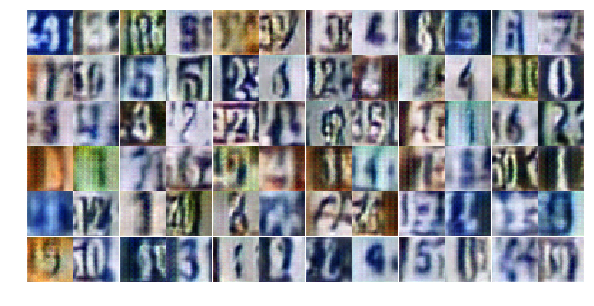

Epoch 6/10... Discriminator Loss: 1.1845... Generator Loss: 1.2143
Epoch 6/10... Discriminator Loss: 1.1702... Generator Loss: 0.6875
Epoch 6/10... Discriminator Loss: 1.0014... Generator Loss: 0.9106
Epoch 7/10... Discriminator Loss: 1.4133... Generator Loss: 1.0194
Epoch 7/10... Discriminator Loss: 1.2121... Generator Loss: 0.6669
Epoch 7/10... Discriminator Loss: 1.1943... Generator Loss: 0.7199
Epoch 7/10... Discriminator Loss: 1.2326... Generator Loss: 0.5506
Epoch 7/10... Discriminator Loss: 1.3247... Generator Loss: 0.6852
Epoch 7/10... Discriminator Loss: 1.2489... Generator Loss: 0.8019
Epoch 7/10... Discriminator Loss: 1.2261... Generator Loss: 0.6825


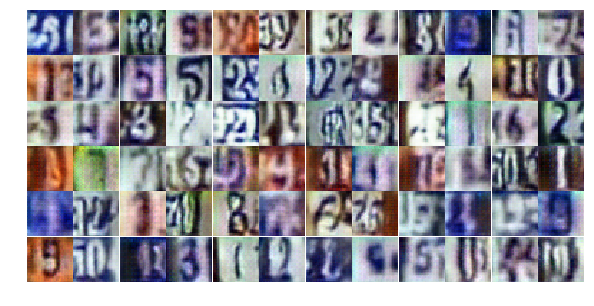

Epoch 7/10... Discriminator Loss: 1.1187... Generator Loss: 0.9500
Epoch 7/10... Discriminator Loss: 1.2016... Generator Loss: 0.7123
Epoch 7/10... Discriminator Loss: 1.3656... Generator Loss: 0.7814
Epoch 7/10... Discriminator Loss: 1.4800... Generator Loss: 0.3654
Epoch 7/10... Discriminator Loss: 1.1575... Generator Loss: 0.8791
Epoch 7/10... Discriminator Loss: 1.2215... Generator Loss: 0.6518
Epoch 7/10... Discriminator Loss: 1.1276... Generator Loss: 0.9029
Epoch 7/10... Discriminator Loss: 1.2593... Generator Loss: 0.9967
Epoch 7/10... Discriminator Loss: 1.2450... Generator Loss: 0.9911
Epoch 7/10... Discriminator Loss: 1.0132... Generator Loss: 1.0220


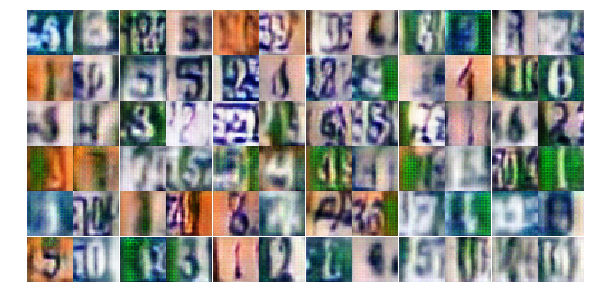

Epoch 7/10... Discriminator Loss: 1.3346... Generator Loss: 0.5634
Epoch 7/10... Discriminator Loss: 1.0530... Generator Loss: 0.7995
Epoch 7/10... Discriminator Loss: 1.2596... Generator Loss: 0.5529
Epoch 7/10... Discriminator Loss: 1.1168... Generator Loss: 0.6396
Epoch 7/10... Discriminator Loss: 1.1257... Generator Loss: 0.9537
Epoch 7/10... Discriminator Loss: 1.1243... Generator Loss: 1.0284
Epoch 7/10... Discriminator Loss: 1.3503... Generator Loss: 0.7791
Epoch 7/10... Discriminator Loss: 1.3510... Generator Loss: 0.5423
Epoch 7/10... Discriminator Loss: 1.0195... Generator Loss: 1.1240
Epoch 7/10... Discriminator Loss: 1.3291... Generator Loss: 0.5067


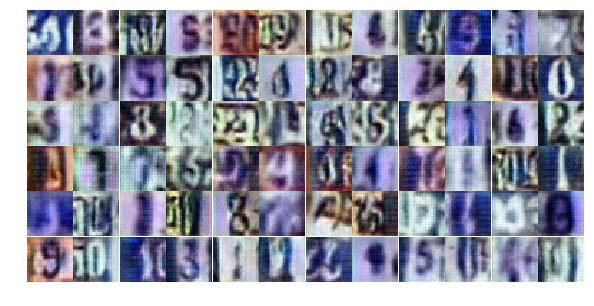

Epoch 7/10... Discriminator Loss: 1.3388... Generator Loss: 0.5295
Epoch 7/10... Discriminator Loss: 1.5931... Generator Loss: 0.3190
Epoch 7/10... Discriminator Loss: 1.1454... Generator Loss: 0.6420
Epoch 7/10... Discriminator Loss: 1.0719... Generator Loss: 0.7528
Epoch 7/10... Discriminator Loss: 1.1458... Generator Loss: 0.6604
Epoch 7/10... Discriminator Loss: 1.3414... Generator Loss: 0.4419
Epoch 7/10... Discriminator Loss: 1.2806... Generator Loss: 0.5062
Epoch 7/10... Discriminator Loss: 1.2746... Generator Loss: 0.5156
Epoch 7/10... Discriminator Loss: 1.1856... Generator Loss: 0.6749
Epoch 7/10... Discriminator Loss: 1.4959... Generator Loss: 1.9327


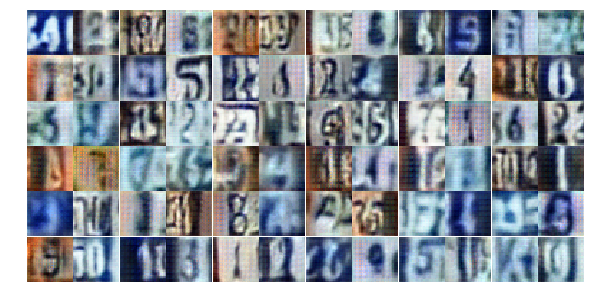

Epoch 7/10... Discriminator Loss: 1.2116... Generator Loss: 0.5911
Epoch 7/10... Discriminator Loss: 1.2836... Generator Loss: 0.6431
Epoch 7/10... Discriminator Loss: 1.0583... Generator Loss: 0.6249
Epoch 7/10... Discriminator Loss: 1.1834... Generator Loss: 0.6400
Epoch 7/10... Discriminator Loss: 0.9731... Generator Loss: 1.1800
Epoch 7/10... Discriminator Loss: 0.9407... Generator Loss: 0.9531
Epoch 7/10... Discriminator Loss: 1.0463... Generator Loss: 0.7873
Epoch 7/10... Discriminator Loss: 1.6354... Generator Loss: 0.5193
Epoch 7/10... Discriminator Loss: 1.3672... Generator Loss: 0.6466
Epoch 7/10... Discriminator Loss: 1.2973... Generator Loss: 0.4985


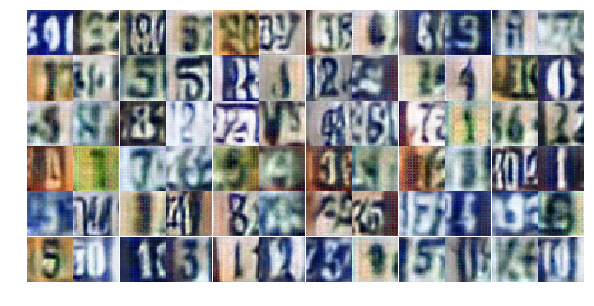

Epoch 7/10... Discriminator Loss: 1.0019... Generator Loss: 0.9633
Epoch 7/10... Discriminator Loss: 1.1315... Generator Loss: 0.6825
Epoch 7/10... Discriminator Loss: 1.2735... Generator Loss: 1.2410
Epoch 7/10... Discriminator Loss: 1.0335... Generator Loss: 1.0602
Epoch 7/10... Discriminator Loss: 1.1697... Generator Loss: 0.6132
Epoch 7/10... Discriminator Loss: 1.0426... Generator Loss: 0.8258
Epoch 7/10... Discriminator Loss: 1.4664... Generator Loss: 0.5383
Epoch 7/10... Discriminator Loss: 1.2266... Generator Loss: 1.3746
Epoch 7/10... Discriminator Loss: 1.1928... Generator Loss: 0.7939
Epoch 7/10... Discriminator Loss: 0.7892... Generator Loss: 1.2278


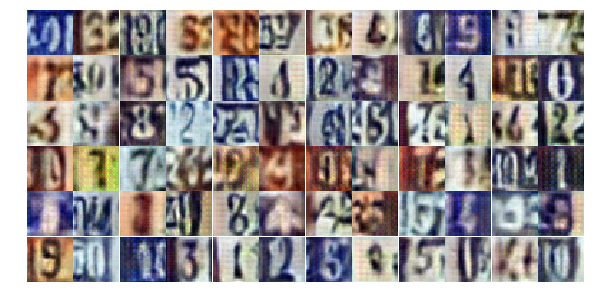

Epoch 7/10... Discriminator Loss: 1.1200... Generator Loss: 0.9425
Epoch 8/10... Discriminator Loss: 1.1744... Generator Loss: 0.5973
Epoch 8/10... Discriminator Loss: 1.2384... Generator Loss: 0.5206
Epoch 8/10... Discriminator Loss: 1.0839... Generator Loss: 0.7703
Epoch 8/10... Discriminator Loss: 1.0508... Generator Loss: 0.9386
Epoch 8/10... Discriminator Loss: 1.4663... Generator Loss: 0.4102
Epoch 8/10... Discriminator Loss: 1.1135... Generator Loss: 0.6510
Epoch 8/10... Discriminator Loss: 0.8335... Generator Loss: 1.3344
Epoch 8/10... Discriminator Loss: 1.0903... Generator Loss: 0.8297
Epoch 8/10... Discriminator Loss: 1.1746... Generator Loss: 1.1904


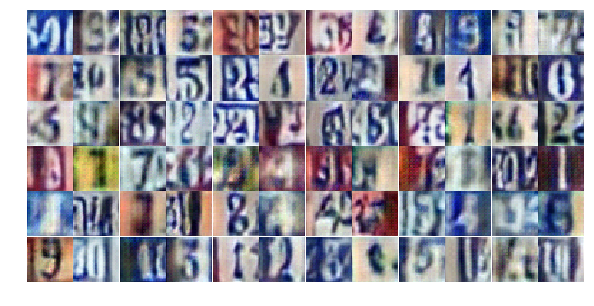

Epoch 8/10... Discriminator Loss: 1.0032... Generator Loss: 0.8231
Epoch 8/10... Discriminator Loss: 1.0254... Generator Loss: 1.0712
Epoch 8/10... Discriminator Loss: 1.2528... Generator Loss: 0.5252
Epoch 8/10... Discriminator Loss: 0.9224... Generator Loss: 1.5696
Epoch 8/10... Discriminator Loss: 1.2035... Generator Loss: 0.6753
Epoch 8/10... Discriminator Loss: 0.9646... Generator Loss: 1.2646
Epoch 8/10... Discriminator Loss: 1.1115... Generator Loss: 0.6842
Epoch 8/10... Discriminator Loss: 1.1915... Generator Loss: 0.7075
Epoch 8/10... Discriminator Loss: 1.0100... Generator Loss: 1.0699
Epoch 8/10... Discriminator Loss: 1.2290... Generator Loss: 1.0191


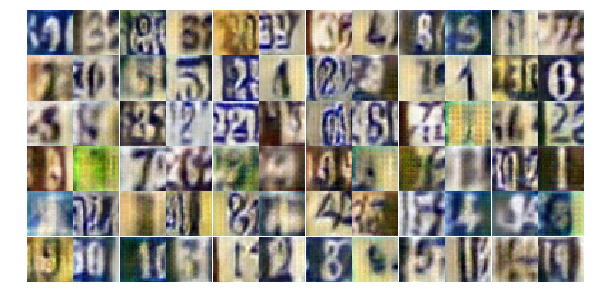

Epoch 8/10... Discriminator Loss: 1.2091... Generator Loss: 0.6410
Epoch 8/10... Discriminator Loss: 1.0590... Generator Loss: 0.6985
Epoch 8/10... Discriminator Loss: 0.9869... Generator Loss: 0.8783
Epoch 8/10... Discriminator Loss: 1.1706... Generator Loss: 0.8275
Epoch 8/10... Discriminator Loss: 1.1142... Generator Loss: 1.1216
Epoch 8/10... Discriminator Loss: 1.1879... Generator Loss: 0.9097
Epoch 8/10... Discriminator Loss: 0.8935... Generator Loss: 0.9476
Epoch 8/10... Discriminator Loss: 0.9726... Generator Loss: 0.8900
Epoch 8/10... Discriminator Loss: 1.3995... Generator Loss: 0.8965
Epoch 8/10... Discriminator Loss: 1.2917... Generator Loss: 0.6393


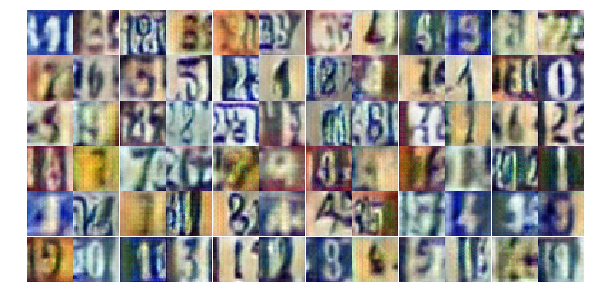

Epoch 8/10... Discriminator Loss: 1.0667... Generator Loss: 0.8883
Epoch 8/10... Discriminator Loss: 1.1541... Generator Loss: 0.5660
Epoch 8/10... Discriminator Loss: 1.3279... Generator Loss: 0.4485
Epoch 8/10... Discriminator Loss: 1.7071... Generator Loss: 0.2658
Epoch 8/10... Discriminator Loss: 1.0512... Generator Loss: 0.6823
Epoch 8/10... Discriminator Loss: 0.8155... Generator Loss: 1.0241
Epoch 8/10... Discriminator Loss: 1.2951... Generator Loss: 0.4689
Epoch 8/10... Discriminator Loss: 1.0801... Generator Loss: 1.2690
Epoch 8/10... Discriminator Loss: 1.0933... Generator Loss: 0.6524
Epoch 8/10... Discriminator Loss: 1.0011... Generator Loss: 0.8655


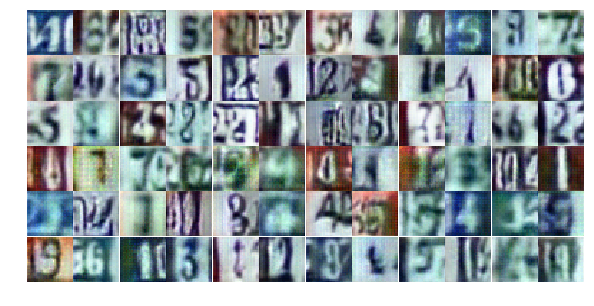

Epoch 8/10... Discriminator Loss: 1.1391... Generator Loss: 1.4930
Epoch 8/10... Discriminator Loss: 1.1580... Generator Loss: 0.7814
Epoch 8/10... Discriminator Loss: 1.1465... Generator Loss: 0.6133
Epoch 8/10... Discriminator Loss: 1.1870... Generator Loss: 1.0843
Epoch 8/10... Discriminator Loss: 1.0179... Generator Loss: 1.0570
Epoch 8/10... Discriminator Loss: 1.1937... Generator Loss: 0.5297
Epoch 8/10... Discriminator Loss: 0.8108... Generator Loss: 1.0942
Epoch 8/10... Discriminator Loss: 1.0015... Generator Loss: 0.7003
Epoch 8/10... Discriminator Loss: 1.7364... Generator Loss: 0.2857
Epoch 8/10... Discriminator Loss: 1.1296... Generator Loss: 1.0585


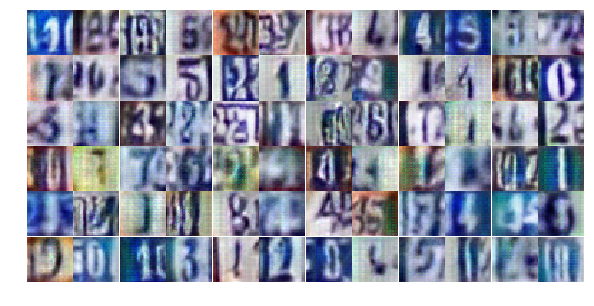

Epoch 8/10... Discriminator Loss: 1.2457... Generator Loss: 1.2109
Epoch 8/10... Discriminator Loss: 1.1207... Generator Loss: 0.6452
Epoch 8/10... Discriminator Loss: 0.8120... Generator Loss: 0.9828
Epoch 8/10... Discriminator Loss: 0.9842... Generator Loss: 0.7536
Epoch 8/10... Discriminator Loss: 1.1466... Generator Loss: 1.5981
Epoch 8/10... Discriminator Loss: 1.2965... Generator Loss: 1.6112
Epoch 8/10... Discriminator Loss: 1.0513... Generator Loss: 0.7989
Epoch 8/10... Discriminator Loss: 1.1145... Generator Loss: 1.2238
Epoch 9/10... Discriminator Loss: 1.3228... Generator Loss: 1.7387
Epoch 9/10... Discriminator Loss: 1.1409... Generator Loss: 0.7957


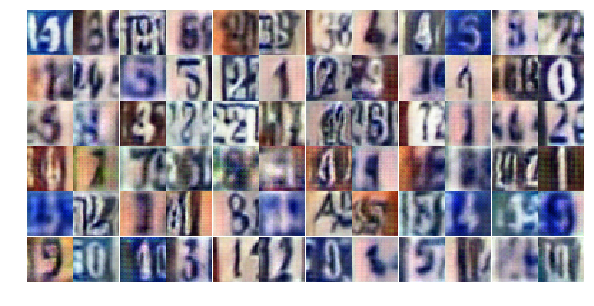

Epoch 9/10... Discriminator Loss: 1.2212... Generator Loss: 0.7445
Epoch 9/10... Discriminator Loss: 0.9007... Generator Loss: 1.2022
Epoch 9/10... Discriminator Loss: 1.1591... Generator Loss: 0.6104
Epoch 9/10... Discriminator Loss: 1.3778... Generator Loss: 0.4653
Epoch 9/10... Discriminator Loss: 1.2199... Generator Loss: 0.5938
Epoch 9/10... Discriminator Loss: 0.9730... Generator Loss: 1.0978
Epoch 9/10... Discriminator Loss: 1.4221... Generator Loss: 0.4284
Epoch 9/10... Discriminator Loss: 0.9901... Generator Loss: 0.8117
Epoch 9/10... Discriminator Loss: 0.9939... Generator Loss: 0.7859
Epoch 9/10... Discriminator Loss: 0.7204... Generator Loss: 1.5394


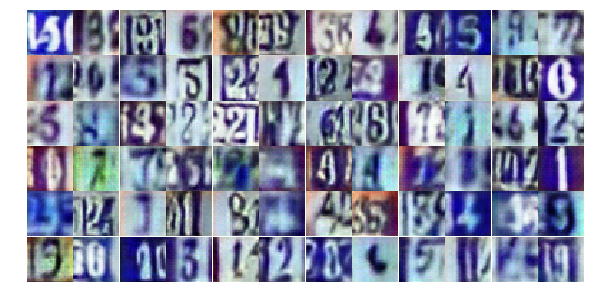

Epoch 9/10... Discriminator Loss: 1.0593... Generator Loss: 0.7908
Epoch 9/10... Discriminator Loss: 1.2146... Generator Loss: 0.6883
Epoch 9/10... Discriminator Loss: 1.2357... Generator Loss: 2.1639
Epoch 9/10... Discriminator Loss: 1.2878... Generator Loss: 0.5613
Epoch 9/10... Discriminator Loss: 1.0007... Generator Loss: 1.1340
Epoch 9/10... Discriminator Loss: 0.9936... Generator Loss: 1.2445
Epoch 9/10... Discriminator Loss: 1.4132... Generator Loss: 0.4349
Epoch 9/10... Discriminator Loss: 1.1282... Generator Loss: 0.5738
Epoch 9/10... Discriminator Loss: 1.3555... Generator Loss: 0.4648
Epoch 9/10... Discriminator Loss: 1.2775... Generator Loss: 0.6222


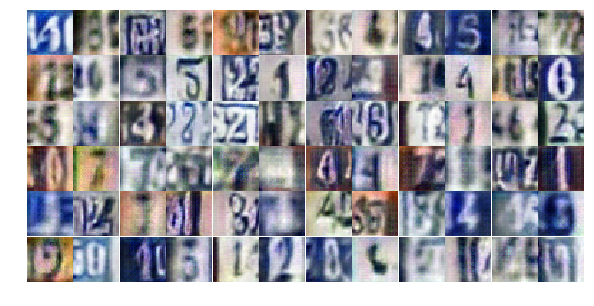

Epoch 9/10... Discriminator Loss: 0.8513... Generator Loss: 0.8889
Epoch 9/10... Discriminator Loss: 0.8994... Generator Loss: 0.8764
Epoch 9/10... Discriminator Loss: 1.5251... Generator Loss: 0.3183
Epoch 9/10... Discriminator Loss: 1.4098... Generator Loss: 0.4440
Epoch 9/10... Discriminator Loss: 1.0218... Generator Loss: 0.7868
Epoch 9/10... Discriminator Loss: 1.2365... Generator Loss: 1.3125
Epoch 9/10... Discriminator Loss: 1.4101... Generator Loss: 0.4837
Epoch 9/10... Discriminator Loss: 0.9606... Generator Loss: 0.9028
Epoch 9/10... Discriminator Loss: 0.7799... Generator Loss: 1.6834
Epoch 9/10... Discriminator Loss: 1.3497... Generator Loss: 0.3988


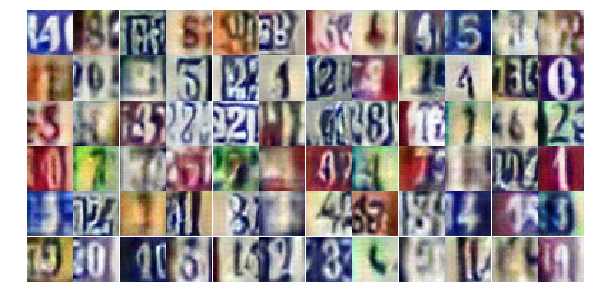

Epoch 9/10... Discriminator Loss: 1.0369... Generator Loss: 0.7583
Epoch 9/10... Discriminator Loss: 1.3900... Generator Loss: 0.4256
Epoch 9/10... Discriminator Loss: 0.8013... Generator Loss: 1.0226
Epoch 9/10... Discriminator Loss: 1.5113... Generator Loss: 0.4070
Epoch 9/10... Discriminator Loss: 1.2603... Generator Loss: 0.6251
Epoch 9/10... Discriminator Loss: 0.9644... Generator Loss: 1.3446
Epoch 9/10... Discriminator Loss: 0.8312... Generator Loss: 1.5797
Epoch 9/10... Discriminator Loss: 0.7974... Generator Loss: 1.3418
Epoch 9/10... Discriminator Loss: 1.3706... Generator Loss: 0.4735
Epoch 9/10... Discriminator Loss: 1.0075... Generator Loss: 0.7428


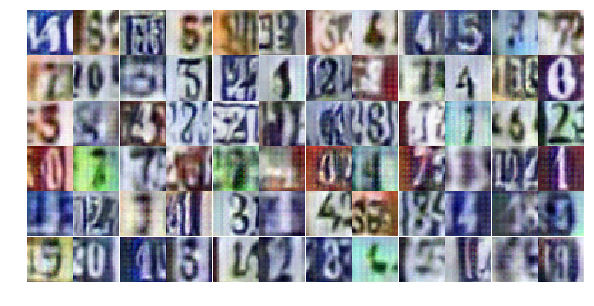

Epoch 9/10... Discriminator Loss: 0.8173... Generator Loss: 1.0293
Epoch 9/10... Discriminator Loss: 1.1178... Generator Loss: 1.0490
Epoch 9/10... Discriminator Loss: 0.9192... Generator Loss: 1.4838
Epoch 9/10... Discriminator Loss: 0.7537... Generator Loss: 1.7807
Epoch 9/10... Discriminator Loss: 0.8510... Generator Loss: 0.9957
Epoch 9/10... Discriminator Loss: 1.3696... Generator Loss: 0.4586
Epoch 9/10... Discriminator Loss: 1.0361... Generator Loss: 0.7257
Epoch 9/10... Discriminator Loss: 1.2589... Generator Loss: 0.5325
Epoch 9/10... Discriminator Loss: 1.2925... Generator Loss: 0.6403
Epoch 9/10... Discriminator Loss: 0.9538... Generator Loss: 0.9899


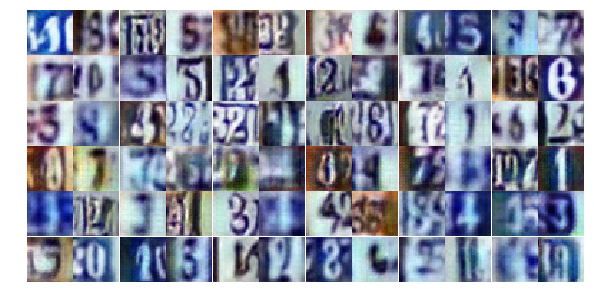

Epoch 9/10... Discriminator Loss: 1.0366... Generator Loss: 0.9454
Epoch 9/10... Discriminator Loss: 0.8630... Generator Loss: 1.7075
Epoch 9/10... Discriminator Loss: 1.1790... Generator Loss: 0.5568
Epoch 9/10... Discriminator Loss: 1.2997... Generator Loss: 0.4650
Epoch 9/10... Discriminator Loss: 1.2925... Generator Loss: 0.4359
Epoch 10/10... Discriminator Loss: 1.0735... Generator Loss: 0.8185
Epoch 10/10... Discriminator Loss: 0.8313... Generator Loss: 1.1950
Epoch 10/10... Discriminator Loss: 1.4424... Generator Loss: 0.3636
Epoch 10/10... Discriminator Loss: 1.1723... Generator Loss: 0.8318
Epoch 10/10... Discriminator Loss: 1.4760... Generator Loss: 0.4104


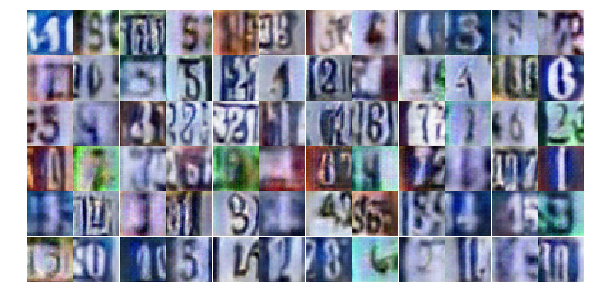

Epoch 10/10... Discriminator Loss: 1.3017... Generator Loss: 0.5094
Epoch 10/10... Discriminator Loss: 0.7727... Generator Loss: 1.0104
Epoch 10/10... Discriminator Loss: 1.0379... Generator Loss: 0.6411
Epoch 10/10... Discriminator Loss: 0.8849... Generator Loss: 0.9442
Epoch 10/10... Discriminator Loss: 1.2450... Generator Loss: 0.6139
Epoch 10/10... Discriminator Loss: 1.2612... Generator Loss: 0.5136
Epoch 10/10... Discriminator Loss: 0.7848... Generator Loss: 1.1027
Epoch 10/10... Discriminator Loss: 1.0155... Generator Loss: 0.8957
Epoch 10/10... Discriminator Loss: 1.8687... Generator Loss: 0.2620
Epoch 10/10... Discriminator Loss: 1.1853... Generator Loss: 0.8827


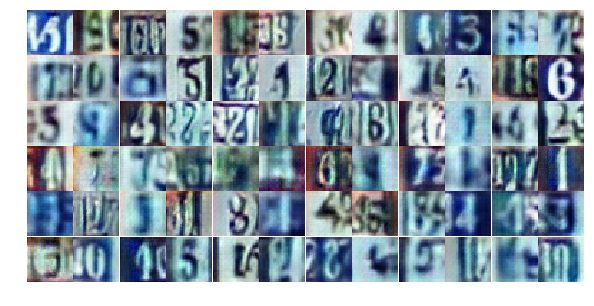

Epoch 10/10... Discriminator Loss: 0.7976... Generator Loss: 1.3144
Epoch 10/10... Discriminator Loss: 1.0075... Generator Loss: 0.8885
Epoch 10/10... Discriminator Loss: 1.0781... Generator Loss: 0.7892
Epoch 10/10... Discriminator Loss: 1.1383... Generator Loss: 0.6173
Epoch 10/10... Discriminator Loss: 0.8614... Generator Loss: 0.8675
Epoch 10/10... Discriminator Loss: 1.2790... Generator Loss: 0.4703
Epoch 10/10... Discriminator Loss: 1.1446... Generator Loss: 0.5837
Epoch 10/10... Discriminator Loss: 0.9881... Generator Loss: 0.8846
Epoch 10/10... Discriminator Loss: 1.1739... Generator Loss: 0.5704
Epoch 10/10... Discriminator Loss: 0.7547... Generator Loss: 1.8071


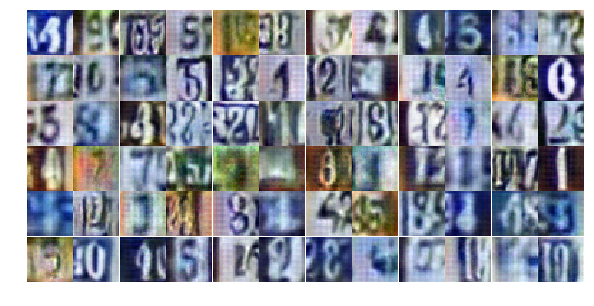

Epoch 10/10... Discriminator Loss: 1.3670... Generator Loss: 0.4020
Epoch 10/10... Discriminator Loss: 1.3520... Generator Loss: 0.5070
Epoch 10/10... Discriminator Loss: 0.7972... Generator Loss: 1.7907
Epoch 10/10... Discriminator Loss: 1.0111... Generator Loss: 1.1212
Epoch 10/10... Discriminator Loss: 1.0266... Generator Loss: 0.6767
Epoch 10/10... Discriminator Loss: 0.7590... Generator Loss: 1.1088
Epoch 10/10... Discriminator Loss: 0.8314... Generator Loss: 0.8293
Epoch 10/10... Discriminator Loss: 1.7453... Generator Loss: 0.3051
Epoch 10/10... Discriminator Loss: 0.5834... Generator Loss: 1.2165
Epoch 10/10... Discriminator Loss: 0.8891... Generator Loss: 1.0215


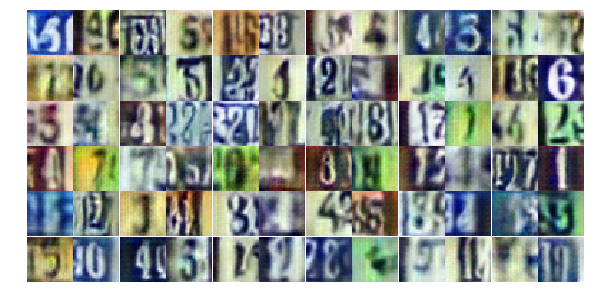

Epoch 10/10... Discriminator Loss: 0.7896... Generator Loss: 1.4468
Epoch 10/10... Discriminator Loss: 1.3453... Generator Loss: 0.4324
Epoch 10/10... Discriminator Loss: 0.8095... Generator Loss: 1.9138
Epoch 10/10... Discriminator Loss: 1.0798... Generator Loss: 0.5884
Epoch 10/10... Discriminator Loss: 1.8361... Generator Loss: 0.2530
Epoch 10/10... Discriminator Loss: 1.2396... Generator Loss: 0.5542
Epoch 10/10... Discriminator Loss: 1.8097... Generator Loss: 0.5854
Epoch 10/10... Discriminator Loss: 0.9933... Generator Loss: 0.7081
Epoch 10/10... Discriminator Loss: 1.0517... Generator Loss: 0.8534
Epoch 10/10... Discriminator Loss: 1.0130... Generator Loss: 0.6563


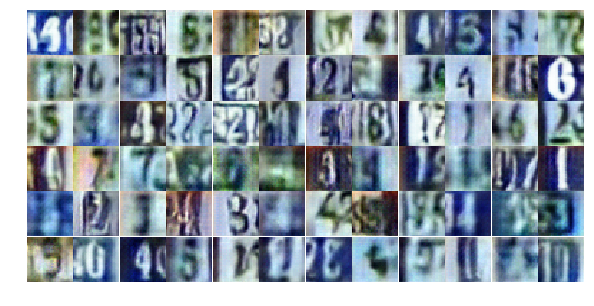

Epoch 10/10... Discriminator Loss: 1.4316... Generator Loss: 0.3852
Epoch 10/10... Discriminator Loss: 0.9843... Generator Loss: 1.5906
Epoch 10/10... Discriminator Loss: 1.4359... Generator Loss: 0.4271
Epoch 10/10... Discriminator Loss: 1.2305... Generator Loss: 0.5732
Epoch 10/10... Discriminator Loss: 0.9209... Generator Loss: 0.8323
Epoch 10/10... Discriminator Loss: 1.1722... Generator Loss: 0.6069
Epoch 10/10... Discriminator Loss: 0.6836... Generator Loss: 1.0794
Epoch 10/10... Discriminator Loss: 0.8102... Generator Loss: 1.1140
Epoch 10/10... Discriminator Loss: 0.6450... Generator Loss: 1.5993
Epoch 10/10... Discriminator Loss: 0.9255... Generator Loss: 1.4474


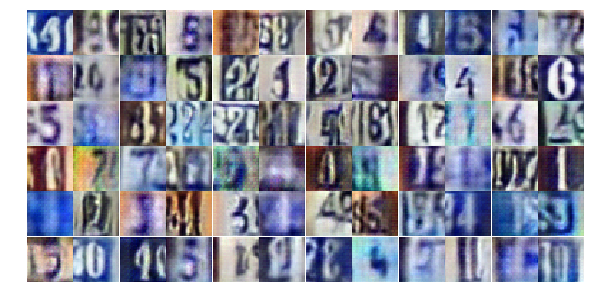

Epoch 10/10... Discriminator Loss: 0.9997... Generator Loss: 2.2745
Epoch 10/10... Discriminator Loss: 0.9427... Generator Loss: 0.7414
Epoch 10/10... Discriminator Loss: 0.9902... Generator Loss: 0.6980


In [20]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

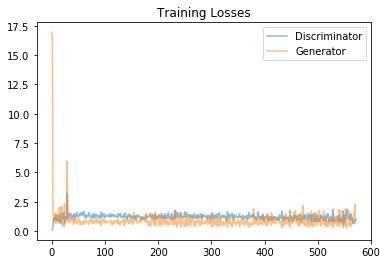

In [21]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

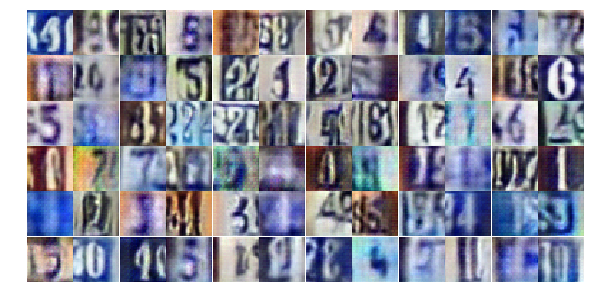

In [22]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

With some more training the images will get better